# Explorative Datenanalyse (EDA) für Bilddatensätze

In diesem Notebook verwenden wir die `ImageEDA`-Klasse für eine umfassende Analyse unseres Bilddatensatzes, einschließlich der Visualisierung von Bounding Boxes aus XML-Annotationen.

In [1]:
import os
import glob
import random
import math
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cv2
import xml.etree.ElementTree as ET
from sklearn.model_selection import train_test_split

# Fix für das joblib/loky CPU-Core Problem
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Wert an deine CPU anpassen

# Import unserer ImageEDA-Klasse
import sys
sys.path.append('../..')  # Pfad zum Hauptverzeichnis hinzufügen
from eda.visualisation import ImageEDA

## Datenpfade definieren

Wir definieren Pfade zu den verschiedenen Datenquellen (Bilder und XML-Annotationen).

In [2]:
# Aktuelles Arbeitsverzeichnis
cwd = os.getcwd()

# Haupt-Datenpfad (enthält die Unterordner train, valid und test)
DATA_DIR = os.path.abspath(os.path.join(cwd, '..', '..', 'data'))

# Die drei Splits, wie sie jetzt in data/ liegen
SPLITS = ['train', 'valid', 'test']

for split in SPLITS:
    split_dir = os.path.join(DATA_DIR, split)
    if not os.path.isdir(split_dir):
        print(f"Ordner nicht gefunden, überspringe: {split_dir}")
        continue

    # Bild-Extensions sammeln
    img_patterns = ['*.jpg', '*.jpeg', '*.png']
    image_files = []
    for p in img_patterns:
        image_files.extend(glob.glob(os.path.join(split_dir, p)))

    # XML-Dateien im selben Ordner
    xml_files = glob.glob(os.path.join(split_dir, '*.xml'))

    # Basenames extrahieren (ohne Endung)
    image_basenames = {os.path.splitext(os.path.basename(f))[0] for f in image_files}
    xml_basenames   = {os.path.splitext(os.path.basename(f))[0] for f in xml_files}

    # Gemeinsam vs. fehlend
    common_files      = image_basenames & xml_basenames
    only_images = image_basenames - xml_basenames
    only_xmls   = xml_basenames - image_basenames

    print(f"\nSplit: {split}")
    print(f"  Gesamt Bilder:         {len(image_files)}")
    print(f"  Gesamt Annotationen:   {len(xml_files)}")
    print(f"  Überlappung (beide):   {len(common_files)}")
    print(f"  Ohne Annotation (.xml):{len(only_images)}")
    print(f"  Ohne Bild (.jpg/.png): {len(only_xmls)}")


Split: train
  Gesamt Bilder:         2765
  Gesamt Annotationen:   2765
  Überlappung (beide):   2765
  Ohne Annotation (.xml):0
  Ohne Bild (.jpg/.png): 0

Split: valid
  Gesamt Bilder:         323
  Gesamt Annotationen:   323
  Überlappung (beide):   323
  Ohne Annotation (.xml):0
  Ohne Bild (.jpg/.png): 0

Split: test
  Gesamt Bilder:         279
  Gesamt Annotationen:   279
  Überlappung (beide):   279
  Ohne Annotation (.xml):0
  Ohne Bild (.jpg/.png): 0


## Visualisierung eines Bildes mit Bounding Box

Diese Funktion zeigt ein zufälliges Bild mit seiner entsprechenden Bounding Box aus der XML-Annotation.


=== Split: train ===


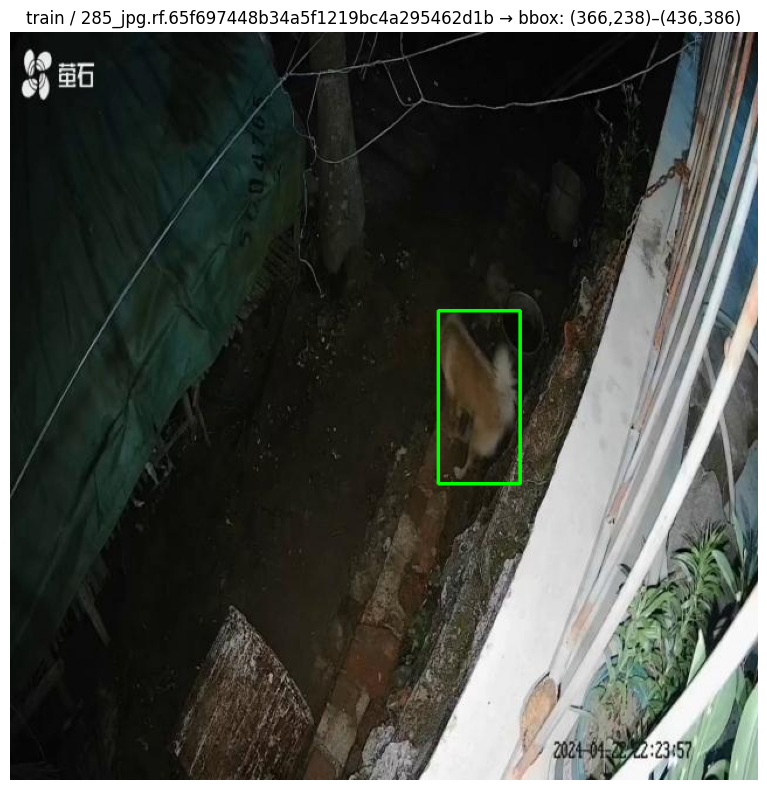


=== Split: valid ===


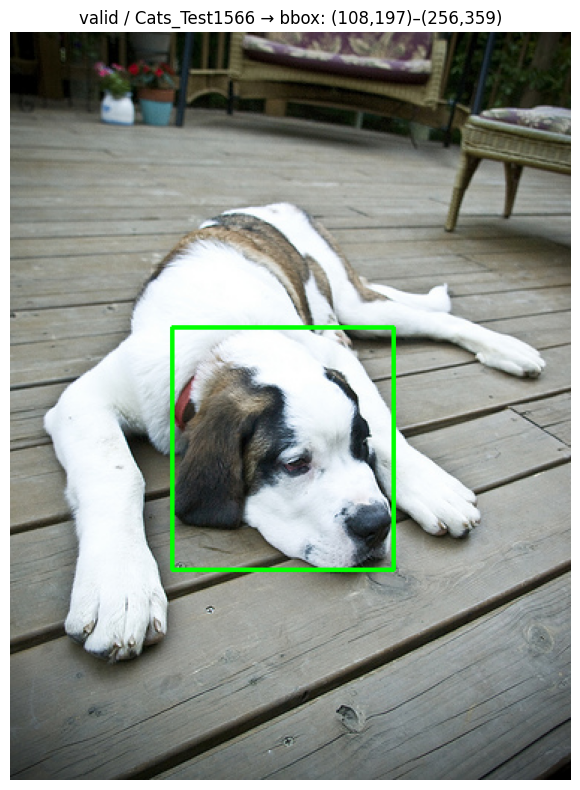


=== Split: test ===


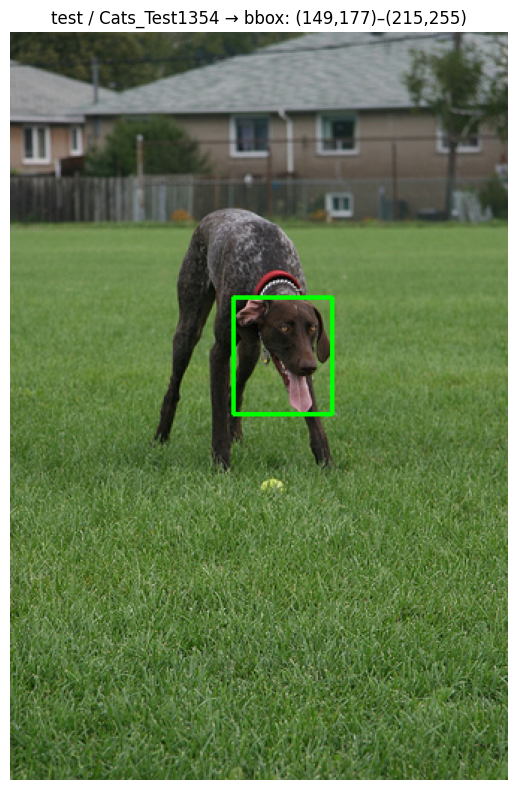

In [3]:
def show_random_image_with_bbox(split: str):
    """
    Zeigt ein zufälliges Bild mit seiner Bounding Box
    aus dem angegebenen Split-Ordner (train/valid/test).
    """
    split_dir = os.path.join(DATA_DIR, split)
    if not os.path.isdir(split_dir):
        print(f"Ordner nicht gefunden: {split_dir}")
        return

    # Alle Bilddateien sammeln
    img_patterns = ['*.jpg', '*.jpeg', '*.png']
    image_files = []
    for pat in img_patterns:
        image_files.extend(glob.glob(os.path.join(split_dir, pat)))

    # Alle XML-Dateien sammeln
    xml_files = glob.glob(os.path.join(split_dir, '*.xml'))

    # Basenames (ohne Endung) ermitteln
    image_basenames = {os.path.splitext(os.path.basename(p))[0] for p in image_files}
    xml_basenames   = {os.path.splitext(os.path.basename(p))[0] for p in xml_files}
    common = list(image_basenames & xml_basenames)

    if not common:
        print(f"Keine gemeinsamen Bild- und XML-Dateien im Split '{split}' gefunden!")
        return

    # Zufälliges gemeinsames Basename wählen
    base_name = random.choice(common)

    # Pfad zum Bild (verschiedene Extensions prüfen)
    img_path = None
    for ext in ['.jpg', '.jpeg', '.png']:
        candidate = os.path.join(split_dir, base_name + ext)
        if os.path.exists(candidate):
            img_path = candidate
            break

    if img_path is None:
        print(f"Bilddatei für {base_name} nicht gefunden.")
        return

    xml_path = os.path.join(split_dir, base_name + '.xml')

    # Bild laden
    img = cv2.imread(img_path)
    if img is None:
        print(f"Konnte Bild {img_path} nicht laden!")
        return

    # XML parsen und Bounding-Box zeichnen
    try:
        tree = ET.parse(xml_path)
        root = tree.getroot()
        obj  = root.find('object')
        bnd  = obj.find('bndbox')
        xmin = int(bnd.find('xmin').text)
        ymin = int(bnd.find('ymin').text)
        xmax = int(bnd.find('xmax').text)
        ymax = int(bnd.find('ymax').text)
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    except Exception as e:
        print(f"Fehler beim Parsen {xml_path}: {e}")
        return

    # Anzeige
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f"{split} / {base_name} → bbox: ({xmin},{ymin})–({xmax},{ymax})")
    plt.tight_layout()
    plt.show()

# Beispielaufruf für alle Splits
for s in SPLITS:
    print(f"\n=== Split: {s} ===")
    show_random_image_with_bbox(s)

## Visualisierung von Bildaugmentierung mit Bounding Boxes

Die folgende Analyse zeigt, wie verschiedene Augmentierungstechniken die Bilder und ihre Annotationen (Bounding Boxes) beeinflussen.


=== Augmentierte Samples für Split: train ===


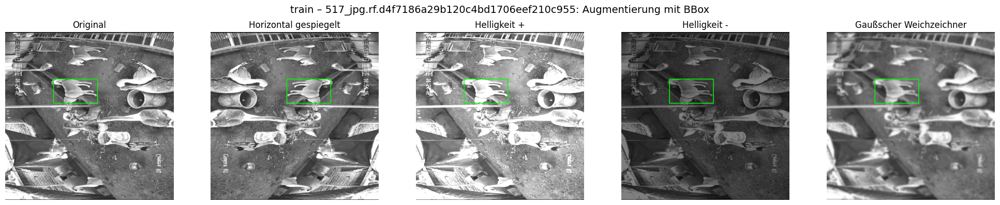

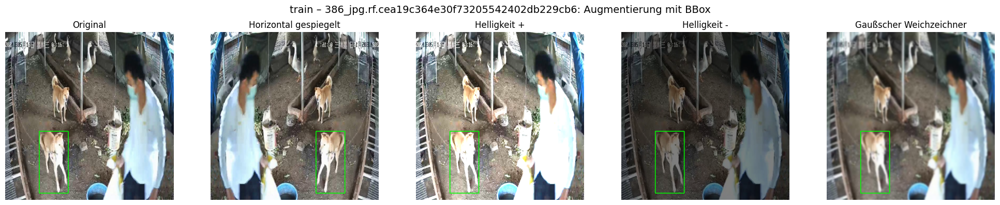


=== Augmentierte Samples für Split: valid ===


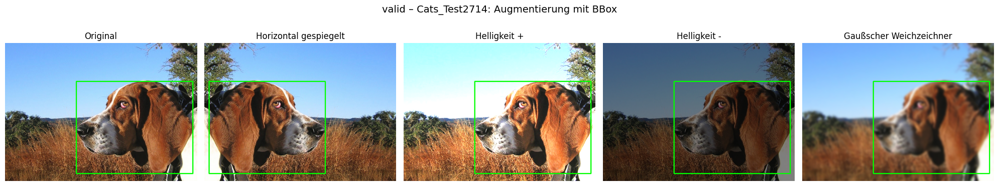

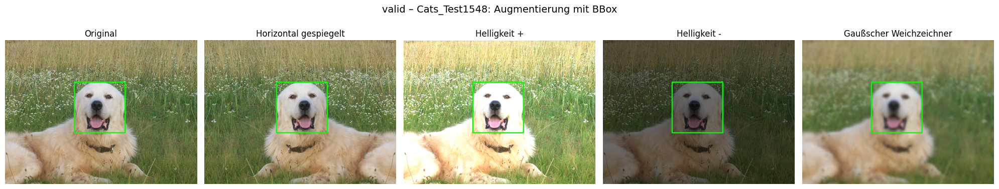


=== Augmentierte Samples für Split: test ===


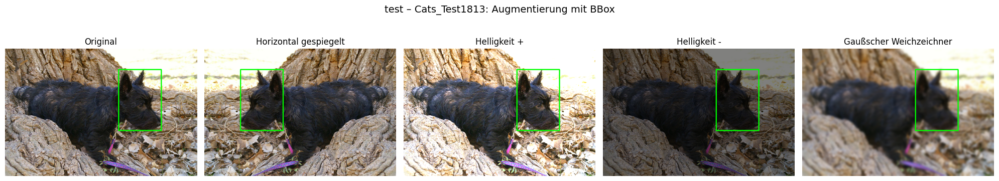

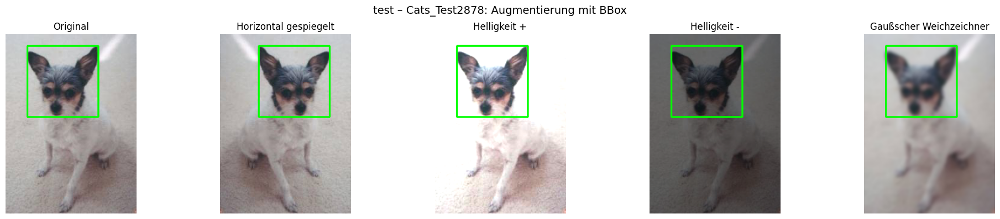

In [4]:
def show_augmented_bbox_samples(split: str, num_samples: int = 3):
    """
    Zeigt num_samples zufällige Bilder mit Bounding Boxes
    und verschiedenen Augmentierungs­techniken aus dem angegebenen Split.
    """
    split_dir = os.path.join(DATA_DIR, split)
    if not os.path.isdir(split_dir):
        print(f"Ordner nicht gefunden: {split_dir}")
        return

    # Sammle Bild- und XML-Basenamen
    img_patterns = ['*.jpg', '*.jpeg', '*.png']
    image_files = []
    for pat in img_patterns:
        image_files.extend(glob.glob(os.path.join(split_dir, pat)))
    xml_files = glob.glob(os.path.join(split_dir, '*.xml'))

    image_basenames = {os.path.splitext(os.path.basename(p))[0] for p in image_files}
    xml_basenames   = {os.path.splitext(os.path.basename(p))[0] for p in xml_files}
    common = list(image_basenames & xml_basenames)
    if not common:
        print(f"Keine gemeinsamen Bild-/XML-Dateien im Split '{split}'.")
        return

    # zufällige Auswahl
    sample_names = random.sample(common, min(num_samples, len(common)))

    # Definition der Augmentierungen
    augmentations = [
        ("Original",                lambda img,b: (img.copy(), b)),
        ("Horizontal gespiegelt",   lambda img,b: (
                                        cv2.flip(img,1),
                                        [img.shape[1]-b[2], b[1], img.shape[1]-b[0], b[3]]
                                      )),
        ("Helligkeit +",            lambda img,b: (cv2.convertScaleAbs(img, alpha=1.5, beta=0), b)),
        ("Helligkeit -",            lambda img,b: (cv2.convertScaleAbs(img, alpha=0.5, beta=0), b)),
        ("Gaußscher Weichzeichner", lambda img,b: (cv2.GaussianBlur(img,(15,15),0), b)),
    ]

    for name in sample_names:
        # Pfade
        img_path = None
        for ext in ['.jpg','.jpeg','.png']:
            cand = os.path.join(split_dir, name+ext)
            if os.path.exists(cand):
                img_path = cand
                break
        xml_path = os.path.join(split_dir, name+'.xml')

        # Bild laden
        img = cv2.imread(img_path)
        if img is None:
            print(f"Konnte Bild nicht laden: {img_path}")
            continue

        # Bounding-Box aus XML
        try:
            tree = ET.parse(xml_path)
            bnd  = tree.getroot().find('object').find('bndbox')
            xmin = int(bnd.find('xmin').text)
            ymin = int(bnd.find('ymin').text)
            xmax = int(bnd.find('xmax').text)
            ymax = int(bnd.find('ymax').text)
            bbox = [xmin, ymin, xmax, ymax]
        except Exception as e:
            print(f"Fehler beim Parsen von {xml_path}: {e}")
            continue

        # Subplots vorbereiten
        fig, axes = plt.subplots(1, len(augmentations), figsize=(4*len(augmentations),4))
        fig.suptitle(f"{split} – {name}: Augmentierung mit BBox", fontsize=14)

        # Augmentierungen anwenden und anzeigen
        for i, (title, fn) in enumerate(augmentations):
            aug_img, aug_bbox = fn(img, bbox)
            img_bb = aug_img.copy()
            cv2.rectangle(img_bb,
                          (int(aug_bbox[0]),int(aug_bbox[1])),
                          (int(aug_bbox[2]),int(aug_bbox[3])),
                          (0,255,0), 2)
            axes[i].imshow(cv2.cvtColor(img_bb, cv2.COLOR_BGR2RGB))
            axes[i].axis('off')
            axes[i].set_title(title)

        plt.tight_layout()
        plt.subplots_adjust(top=0.85)
        plt.show()


# Beispielaufruf für alle Splits
for sp in SPLITS:
    print(f"\n=== Augmentierte Samples für Split: {sp} ===")
    show_augmented_bbox_samples(sp, num_samples=2)

## Initialisierung des EDA-Tools

Wir initialisieren unsere ImageEDA-Klasse mit den Bilddaten.

In [5]:
# ImageEDA initialisieren - wir verwenden das Bilder-Verzeichnis
for split in SPLITS:
    IMAGES_DIR = os.path.join(DATA_DIR, split)
    try:
        eda = ImageEDA(IMAGES_DIR, category_delimiter="_")
        print(f"Split '{split}': ImageEDA wurde erfolgreich initialisiert mit {len(eda.image_data)} Bildern.")
    except Exception as e:
        print(f"Split '{split}': Fehler bei der Initialisierung von ImageEDA: {e}")

Split 'train': ImageEDA wurde erfolgreich initialisiert mit 2765 Bildern.
Split 'valid': ImageEDA wurde erfolgreich initialisiert mit 323 Bildern.
Split 'test': ImageEDA wurde erfolgreich initialisiert mit 279 Bildern.


## Analyse der Klassendistribution

Diese Methode zeigt die Verteilung der Bilder über verschiedene Kategorien.

c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\notebooks\eda\../..\eda\visualisation.py:137: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=labels, y=values, palette="viridis")


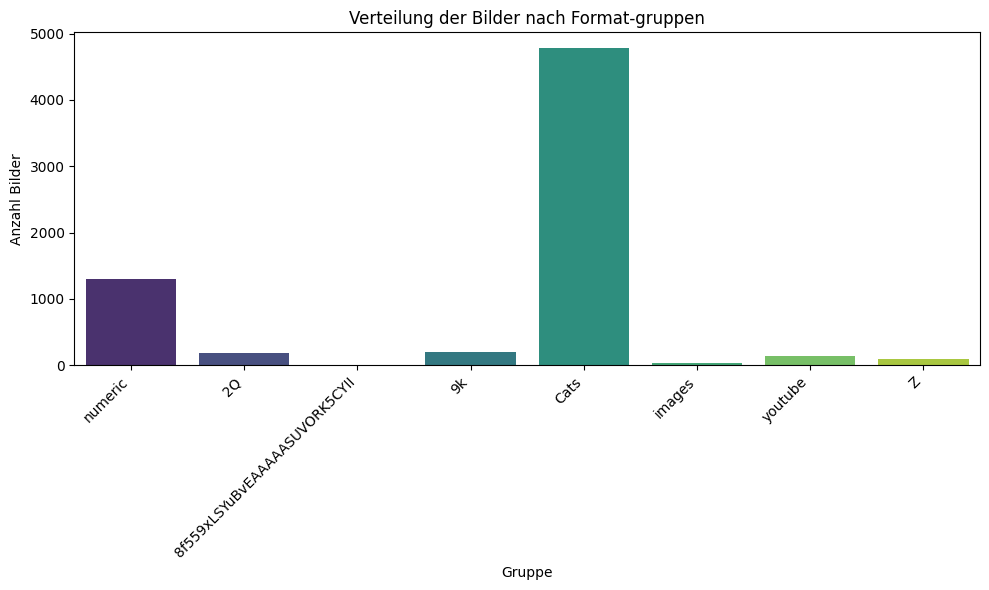

Gesamtzahl der Gruppen: 8
Gesamtzahl der Bilder: 6734
Aufschlüsselung nach Gruppen:
  Cats: 4780
  numeric: 1304
  9k: 194
  2Q: 186
  youtube: 134
  Z: 96
  images: 34
  8f559xLSYuBvEAAAAASUVORK5CYII: 6


In [6]:
# Visualisierung der Klassenverteilung mit größerer Figur
try:
    data_root = "../../data"

    eda = ImageEDA(data_root)

    eda.show_class_distribution_from_dirs(data_root)
except Exception as e:
    print(f"Fehler bei der Anzeige der Klassenverteilung: {e}")

## Visualisierung von Beispielbildern

Hier werden Beispielbilder aus jeder Kategorie angezeigt. Wir erhöhen die Figurengröße, um Layout-Probleme zu vermeiden.

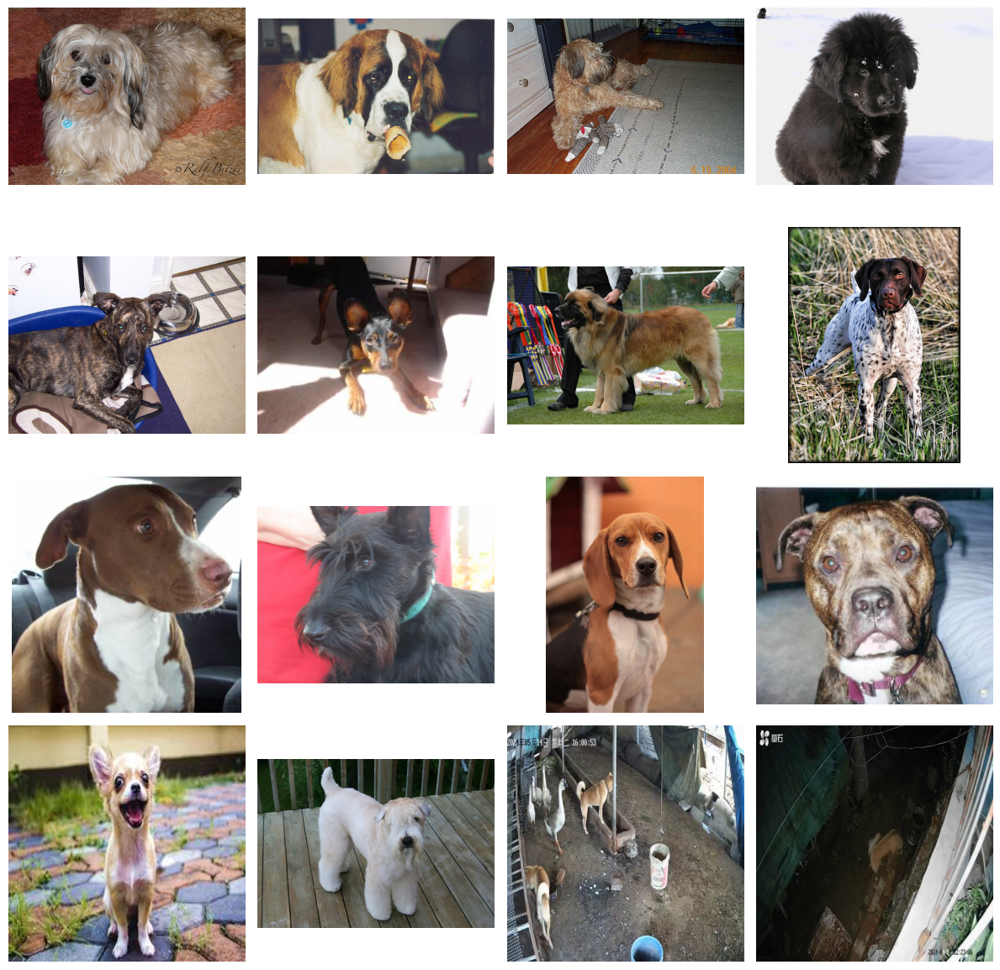

In [7]:
def show_image_grid(
        self,
        n_images: int = 16,
        cols: int = 4,
        figsize=(12, 12)
    ):
        """
        Zeigt bis zu n_images zufällige Bilder in einem cols x rows Grid.
        Für genau eine Kategorie optimiert.
        """
        if self.image_data.empty:
            print("Keine Bilder vorhanden!")
            return

        # Ziehe eine zufällige Teilmenge
        paths = self.image_data["path"].sample(
            min(n_images, len(self.image_data))
        ).tolist()

        rows = math.ceil(len(paths) / cols)
        fig, axes = plt.subplots(rows, cols, figsize=figsize)
        axes = axes.flatten()

        for ax, img_path in zip(axes, paths):
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax.imshow(img)
            else:
                ax.text(0.5, 0.5, "Lade-Fehler", ha="center", va="center")
            ax.axis("off")

        # Falls z.B. rows*cols > len(paths), die übrigen Achsen ausblenden
        for ax in axes[len(paths):]:
            ax.axis("off")

        plt.tight_layout()
        plt.show()

# Zeige Beispiele in Batches von jeweils 5 Kategorien mit 3 Bildern pro Kategorie
show_image_grid(eda)

## Analyse der Bildabmessungen

Diese Analyse untersucht die Verteilung der Bildgrößen und -eigenschaften.

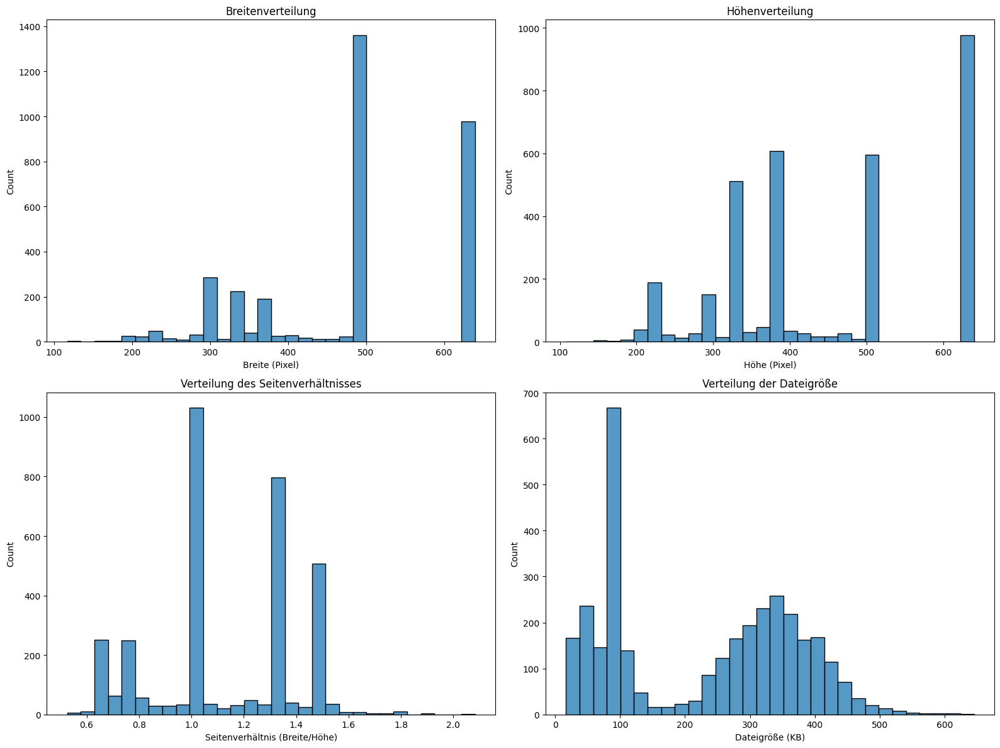

Statistiken der Bildabmessungen:
             width       height  aspect_ratio    file_size
count  3367.000000  3367.000000   3367.000000  3367.000000
mean    487.734482   452.646273      1.128409   230.175199
std     125.578907   141.058676      0.278315   141.593515
min     117.000000   108.000000      0.526000    16.699219
25%     375.000000   333.000000      1.000000    87.716797
50%     500.000000   400.000000      1.000000   267.087891
75%     640.000000   640.000000      1.333333   350.323242
max     640.000000   640.000000      2.083333   644.892578


In [8]:
# Analyse der Bildabmessungen mit größerer Figur
try:
    eda.analyze_image_dimensions(figsize=(16, 12))
except Exception as e:
    print(f"Fehler bei der Analyse der Bildabmessungen: {e}")

## Farbanalyse

Analyse der dominanten Farben in den Bildern.

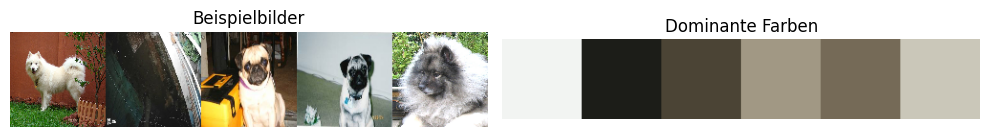

In [9]:
# Farbanalyse mit angepassten Parametern
try:
    eda.analyze_colors(sample_size=20, n_colors=6, figsize=(10,5))
except Exception as e:
    print(f"Fehler bei der Farbanalyse: {e}")

## Beispiele für Bildaugmentierung

Visualisierung verschiedener Augmentierungstechniken.

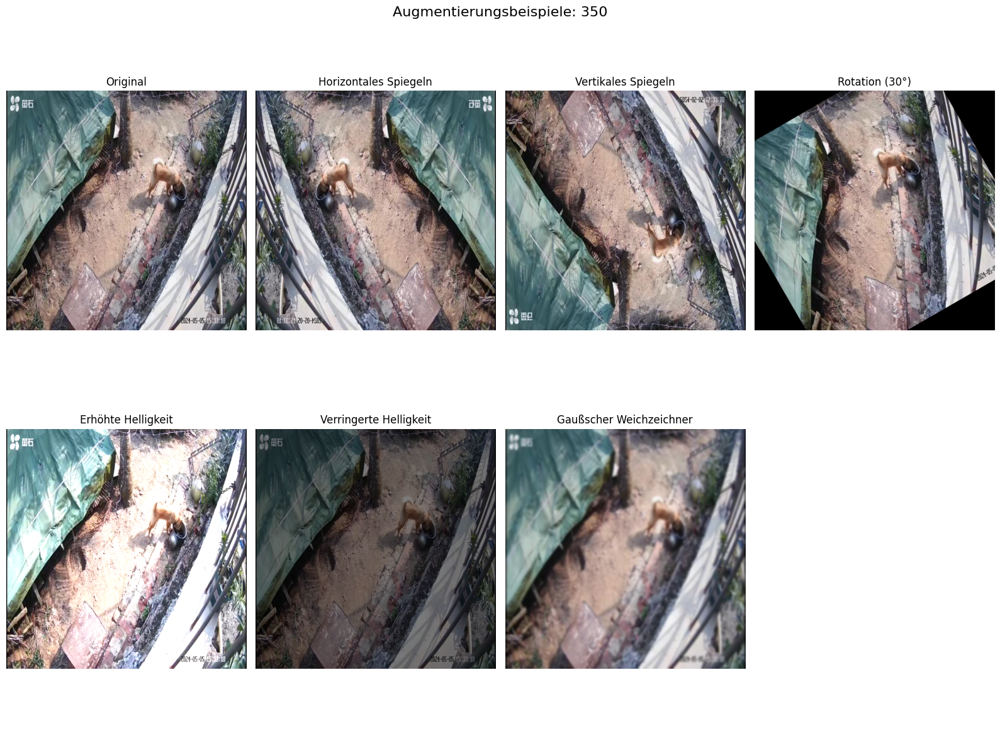

In [10]:
# Augmentierungsbeispiele mit größerer Figur
try:
    eda.show_augmentation_examples(figsize=(16, 12))
except Exception as e:
    print(f"Fehler bei der Anzeige der Augmentierungsbeispiele: {e}")

## Statistiken über Bounding Boxes

Analyse der Größe und Position der Bounding Boxes aus den XML-Annotationen.

Bounding Box Statistik:
            width      height           area  aspect_ratio
count  283.000000  283.000000     283.000000    283.000000
mean   177.706714  180.795053   39830.554770      1.007912
std     96.942087   94.703271   46683.846615      0.288408
min     30.000000   33.000000    1320.000000      0.238095
25%    101.500000  119.000000   12003.000000      0.846154
50%    162.000000  161.000000   23000.000000      1.019231
75%    231.500000  219.000000   47709.000000      1.188922
max    577.000000  616.000000  330621.000000      2.060302


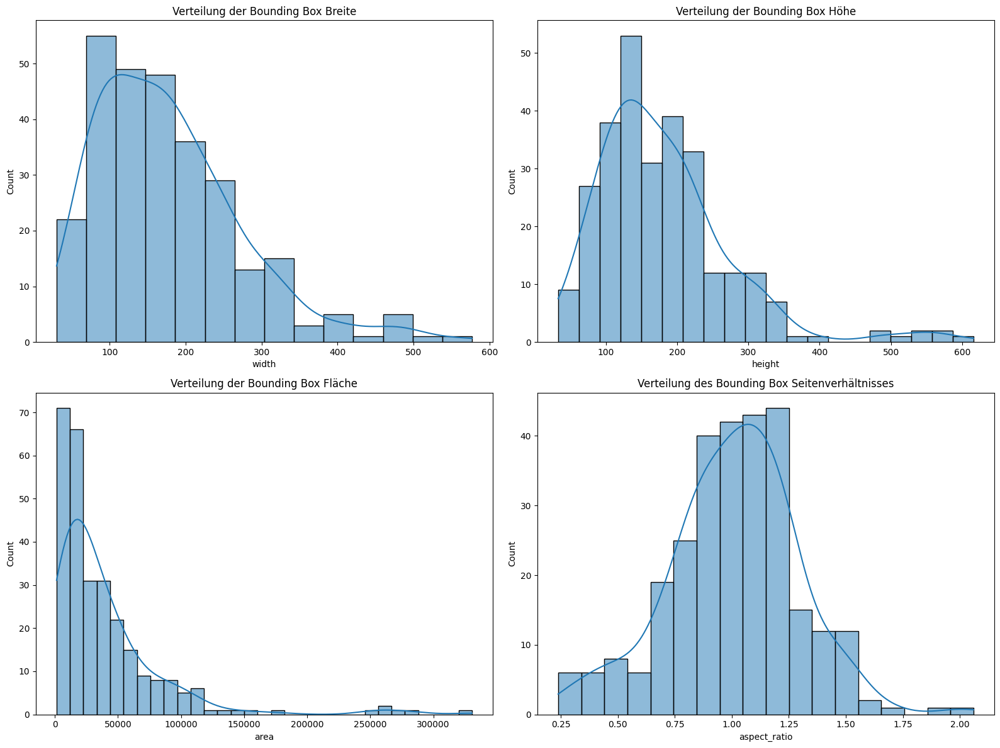

In [11]:
# Sammeln von Statistiken über Bounding Boxes
def analyze_bounding_boxes():
    """
    Analysiert die Größe und Position der Bounding Boxes aus den XML-Annotationen.
    """
    if not xml_files:
        print("Keine XML-Dateien gefunden!")
        return
    
    bbox_data = []
    
    for xml_path in xml_files:
        try:
            tree = ET.parse(xml_path)
            root = tree.getroot()
            for obj in root.findall('object'):
                bnd = obj.find('bndbox')
                if bnd is not None:
                    xmin = int(bnd.find('xmin').text)
                    ymin = int(bnd.find('ymin').text)
                    xmax = int(bnd.find('xmax').text)
                    ymax = int(bnd.find('ymax').text)
                    
                    width = xmax - xmin
                    height = ymax - ymin
                    area = width * height
                    aspect = width / height if height > 0 else 0
                    
                    bbox_data.append({
                        'file': os.path.basename(xml_path),
                        'xmin': xmin,
                        'ymin': ymin,
                        'xmax': xmax,
                        'ymax': ymax,
                        'width': width,
                        'height': height,
                        'area': area,
                        'aspect_ratio': aspect
                    })
        except Exception as e:
            print(f"Fehler beim Parsen der XML-Datei {xml_path}: {e}")
    
    if not bbox_data:
        print("Keine gültigen Bounding Box-Daten gefunden!")
        return
    
    # Daten in DataFrame konvertieren
    bbox_df = pd.DataFrame(bbox_data)
    
    # Statistiken anzeigen
    print("Bounding Box Statistik:")
    print(bbox_df[['width', 'height', 'area', 'aspect_ratio']].describe())
    
    # Visualisierungen
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Breite
    sns.histplot(bbox_df['width'], kde=True, ax=axes[0, 0])
    axes[0, 0].set_title('Verteilung der Bounding Box Breite')
    
    # Höhe
    sns.histplot(bbox_df['height'], kde=True, ax=axes[0, 1])
    axes[0, 1].set_title('Verteilung der Bounding Box Höhe')
    
    # Fläche
    sns.histplot(bbox_df['area'], kde=True, ax=axes[1, 0])
    axes[1, 0].set_title('Verteilung der Bounding Box Fläche')
    
    # Seitenverhältnis
    sns.histplot(bbox_df['aspect_ratio'], kde=True, ax=axes[1, 1])
    axes[1, 1].set_title('Verteilung des Bounding Box Seitenverhältnisses')
    
    plt.tight_layout()
    plt.show()
    
    return bbox_df

# Bounding Box-Analyse durchführen
bbox_stats = analyze_bounding_boxes()